$$\text{Undergraduate Project (UGP) Report}$$
<br>
$$\text{A heterarchical multiscale model for granular materials with evolving grainsize distribution} $$
<br><br><br>
$$Mentor$$
<br>
 $$\text{Prof. Arghya Das}$$
 $$\text{Department of Civil Engineering}$$
 $$\text{IIT Kanpur}$$

<br><br>
$$2023-24-II$$
<br>
<br>

$$\text{Submitted By}$$
$$\text{Md Rahbar} $$
$$\text{210601}$$


## **Understanding Particle Segregation**

The following work is based on the Research Paper by Benjy Marks and Itai Einav named **A heterarchical multiscale model for granular materials with evolving grainsize distribution**


**The segregation is driven by the following criteria:**

### Segregation Rate Calculation:
For each particle in the grid, the segregation rate is computed based on the difference between its own type and the average type of its immediate neighbors (above and below). The formula used is:

$$ f = k_s \cdot \dot{\gamma} \cdot (s_{i_j} - {avg_{size}}) $$

Here, **$s_{i_j}$** is the **type (size) of the current particle**, and avg_size is the average type of the neighboring particles above and below it.

### Behavior of the Segregation:
**Positive Segregation Force (f > 0):** This force occurs when $s_{i_j}$ (the current particle's type) is **greater than $avg_{size}$**. If the current particle is heavier or **larger**, it will attempt to move **up** if possible, contrary to the previous conclusion.

**Negative Segregation Force (f < 0):** This force happens when s_{i_j} is **less than avg_{size}**. If the current particle is lighter or **smaller**, it will attempt to move **down** if possible.

### Implications:
Particles with higher type numbers (interpreted as heavier or larger particles) tend to move downwards because they have a higher type number than the average of their neighbors more often, resulting in a positive segregation force.
Conversely, particles with lower type numbers (lighter or smaller particles) tend to move upwards.
### Conclusion:
If we assume that the types are indicative of size or density (where a higher type number means a heavier or larger particle), then in the simulation:

**Lighter or smaller particles (lower type numbers) will tend to segregate towards the bottom.**

**Heavier or larger particles (higher type numbers) will tend to rise to the top.**

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np

## Simulation of Segregation of Bidisperse Material
Considering Open Systems, without any slope based on 5.1 of ***A heterarchical multiscale model for granular materials***

**Type of Particles = 2**


In [ ]:
class BidisperseMaterialSimulationAdvanced1:
    def __init__(self, column_length=20, ks=1.0, gamma_dot=1.0):
        np.random.seed(42)  # For reproducibility
        self.column = np.random.randint(2, size=column_length)  # Initial column state
        self.ks = ks  # Segregation rate control parameter
        self.gamma_dot = gamma_dot  # Shear rate
        self.history = [self.column.copy()]  # Track history of segregation

    def calculate_segregation_rate(self, i):
        """Calculate the segregation rate for a given position."""
        if i == 0 or i == len(self.column) - 1:  # Edge cases
            return 0
        si_j = self.column[i]
        si_j_minus = self.column[i - 1]
        si_j_plus = self.column[i + 1]
        avg_size = (si_j_minus + si_j_plus) / 2.0
        f = self.ks * self.gamma_dot * (si_j - avg_size)
        return f

    def segregate_step(self):
        """Perform one step of segregation using the advanced model."""
        for phase in [0, 1]:  # Odd and even phases
            for i in range(phase, len(self.column), 2):
                f = self.calculate_segregation_rate(i)
                if f > 0 and i < len(self.column) - 1 and self.column[i] > self.column[i + 1]:
                    # Swap up
                    self.column[i], self.column[i + 1] = self.column[i + 1], self.column[i]
                elif f < 0 and i > 0 and self.column[i] < self.column[i - 1]:
                    # Swap down
                    self.column[i], self.column[i - 1] = self.column[i - 1], self.column[i]
            self.history.append(self.column.copy())  # Add the state to the history after each phase

    def animate(self, steps=50):
        """Animate the segregation process with visible steps."""
        fig, ax = plt.subplots()
        ax.set_title('Advanced Bidisperse Material Segregation Simulation')
        ax.set_xlim(-0.5, 0.5)
        ax.set_ylim(0, len(self.column))
        bars = ax.bar(0, bottom=range(len(self.column)), height=0.8, width=0.5, color='grey', edgecolor='black')

        for _ in range(steps):
            self.segregate_step()  # Perform segregation steps

        def init():
            for bar, height in zip(bars, self.history[0]):
                bar.set_color('blue' if height == 1 else 'red')  # Initial state
            return bars

        def update(frame):
            for bar, height in zip(bars, self.history[frame]):
                bar.set_color('blue' if height == 1 else 'red')
            return bars

        anim = FuncAnimation(fig, update, frames=len(self.history), init_func=init, blit=True, repeat=False)
        plt.close()  # Prevent the static plot from displaying
        return anim



# Initialize and run your simulation
simulation_advanced = BidisperseMaterialSimulationAdvanced1(column_length=20, ks=1.0, gamma_dot=1.0)
# simulation_advanced.run_simulation(steps=50)

# # Plot the static 2D grid of the soil profile over time
# simulation_advanced.plot_static_grid()

# Initialize the simulation with a column of length 20
simulation_advanced = BidisperseMaterialSimulationAdvanced1(column_length=400)
# Run the simulation and animate the segregation process
anim_advanced = simulation_advanced.animate(steps=200)  # Increase the number of steps to better visualize the process

# Display the animation
HTML(anim_advanced.to_jshtml())



## **Simulation of Segregation of Bidisperse Material**
Considering Open Systems, without any slope based on 5.1 of ***A heterarchical multiscale model for granular materials***

**Type of Particles = 3**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

class BidisperseMaterialSimulationAdvanced2:
    def __init__(self, column_length=20, ks=1.0, gamma_dot=1.0, types=3):
        np.random.seed(42)  # For reproducibility
        self.column = np.random.randint(types, size=column_length)  # Initial column state with more than 2 types
        self.ks = ks  # Segregation rate control parameter
        self.gamma_dot = gamma_dot  # Shear rate
        self.history = [self.column.copy()]  # Track history of segregation

    def calculate_segregation_rate(self, i):
        """Calculate the segregation rate for a given position."""
        if i == 0 or i == len(self.column) - 1:  # Edge cases
            return 0
        si_j = self.column[i]
        si_j_minus = self.column[i - 1]
        si_j_plus = self.column[i + 1]
        avg_size = (si_j_minus + si_j_plus) / 2.0
        f = self.ks * self.gamma_dot * (si_j - avg_size)
        return f

    def segregate_step(self):
        """Perform one step of segregation using the advanced model."""
        for phase in [0, 1]:  # Odd and even phases
            for i in range(phase, len(self.column), 2):
                f = self.calculate_segregation_rate(i)
                if f > 0 and i < len(self.column) - 1 and self.column[i] > self.column[i + 1]:
                    self.column[i], self.column[i + 1] = self.column[i + 1], self.column[i]
                elif f < 0 and i > 0 and self.column[i] < self.column[i - 1]:
                    self.column[i], self.column[i - 1] = self.column[i - 1], self.column[i]
            self.history.append(self.column.copy())  # Add the state to the history after each phase

    def animate(self, steps=50):
        """Animate the segregation process with visible steps."""
        fig, ax = plt.subplots()
        ax.set_title('Advanced Bidisperse Material Segregation Simulation')
        ax.set_xlim(-0.5, 0.5)
        ax.set_ylim(0, len(self.column))
        bars = ax.bar(0, bottom=range(len(self.column)), height=0.8, width=0.5, color='grey', edgecolor='black')

        for _ in range(steps):
            self.segregate_step()  # Perform segregation steps

        def init():
            for bar, height in zip(bars, self.history[0]):
                if height == 0:
                    bar.set_color('red')  # Type 0
                elif height == 1:
                    bar.set_color('blue')  # Type 1
                else:
                    bar.set_color('green')  # Type 2 or more
            return bars

        def update(frame):
            for bar, height in zip(bars, self.history[frame]):
                if height == 0:
                    bar.set_color('red')  # Type 0
                elif height == 1:
                    bar.set_color('blue')  # Type 1
                else:
                    bar.set_color('green')  # Type 2 or more
            return bars

        anim = FuncAnimation(fig, update, frames=len(self.history), init_func=init, blit=True, repeat=False)
        plt.close()  # Prevent the static plot from displaying
        return anim

    def plot_static_grid(self):
        """Plot the static 2D grid of the soil profile over time."""
        plt.figure(figsize=(12, 8))
        plt.imshow(self.history, aspect='auto', cmap='viridis')
        plt.colorbar(label='Particle Type')
        plt.title('Soil Profile Over Time')
        plt.xlabel('Position in Column')
        plt.ylabel('Time Step')
        plt.show()

# Initialize the simulation with a column of length 20 and more than 2 types of particles
simulation_advanced = BidisperseMaterialSimulationAdvanced2(column_length=100, types=3)
# Run the simulation and animate the segregation process
anim_advanced = simulation_advanced.animate(steps=50)  # Increase the number of steps to better visualize the process

# Display the animation
HTML(anim_advanced.to_jshtml())


## Time evolution of the average grainsize (**S̄**) of a bidisperse simulation


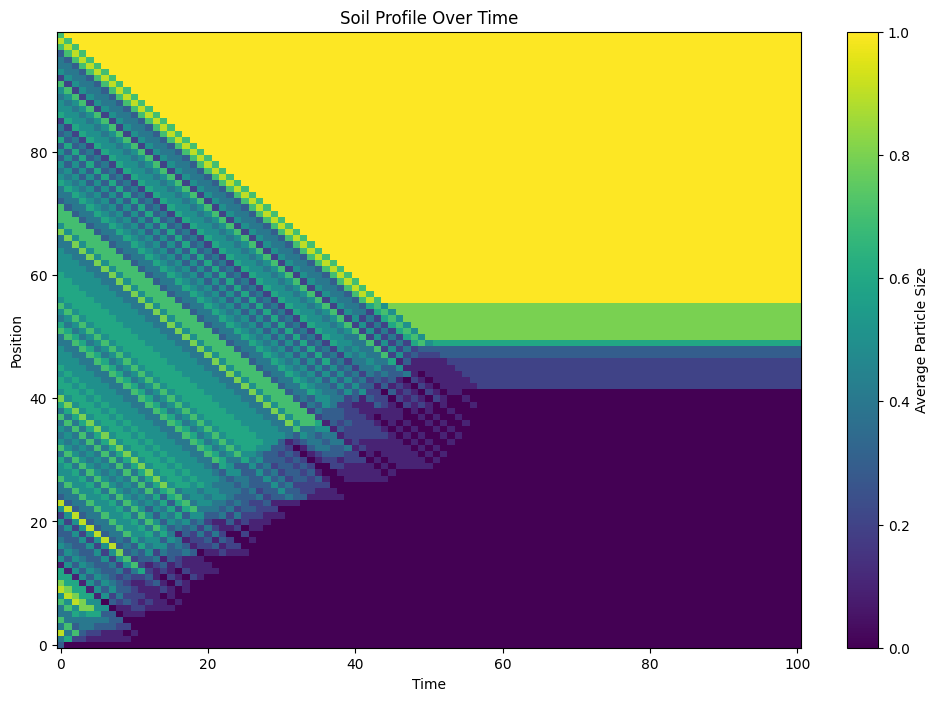

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

class BidisperseMaterialSimulationAdvanced3:
    def __init__(self, column_height=20, column_width=1, ks=1.0, types=2):
        np.random.seed(42)  # For reproducibility
        self.column_height = column_height
        self.column_width = column_width  # Represents the M value
        self.ks = ks  # Segregation rate control parameter
        # Create a 2D array with equal proportions of particle sizes, randomly allocated
        self.column = np.random.choice(types, size=(column_height, column_width))
        self.history = [self.column.copy()]  # Track history of segregation

    def calculate_segregation_rate(self, i, j):
        """Calculate the segregation rate for a given position."""
        if i == 0 or i == self.column_height - 1:  # Edge cases
            return 0
        # Adjust the calculation for the 2D grid and different particle sizes
        si_j = self.column[i][j]
        si_j_minus = self.column[i - 1][j]
        si_j_plus = self.column[i + 1][j]
        avg_size = (si_j_minus + si_j_plus) / 2.0
        f = self.ks * (si_j - avg_size)
        return f

    def apply_shear(self, shear_mode, step):
        """Apply shear to the system depending on the mode."""
        if shear_mode == 'inclined_plane':
            # Apply the non-uniform shear rate formula
            for i in range(self.column_height):
                for j in range(self.column_width):
                    z = i / self.column_height
                    s = self.column[i][j] + 1  # Add 1 to avoid division by zero if sm is 0
                    gamma_dot = np.sqrt(1 - z) / s
                    self.column[i][j] += gamma_dot * step

    def segregate_step(self):
        """Perform one step of segregation using the advanced model."""
        for i in range(self.column_height):
            for j in range(self.column_width):
                f = self.calculate_segregation_rate(i, j)
                if f > 0 and i < self.column_height - 1 and self.column[i][j] > self.column[i + 1][j]:
                    # Swap up
                    self.column[i][j], self.column[i + 1][j] = self.column[i + 1][j], self.column[i][j]
                elif f < 0 and i > 0 and self.column[i][j] < self.column[i - 1][j]:
                    # Swap down
                    self.column[i][j], self.column[i - 1][j] = self.column[i - 1][j], self.column[i][j]
        self.history.append(self.column.copy())  # Add the state to the history after each phase

    def run_simulation(self, steps=50, shear_mode='simple'):
        """Run the simulation for a given number of steps."""
        for step in range(steps):
            if shear_mode != 'simple':
                self.apply_shear(shear_mode, step)
            self.segregate_step()

    def average_in_m_direction(self):
        """Average the results over the m-direction."""
        if self.column_width > 1:
            # Average the history in the m-direction
            averaged_history = [np.mean(state, axis=1) for state in self.history]
        else:
            averaged_history = self.history
        return averaged_history

    def plot_static_grid(self):
        """Plot the static 2D grid of the soil profile over time."""
        averaged_history = self.average_in_m_direction()
        plt.figure(figsize=(12, 8))

        # Convert the history of arrays into a 2D numpy array for plotting
        data_to_plot = np.array(averaged_history).T  # Transpose to switch axes

        # Plot the transposed data to get time on the x-axis and position on the y-axis
        plt.imshow(data_to_plot, aspect='auto', cmap='viridis', origin='lower')

        plt.colorbar(label='Average Particle Size')
        plt.title('Soil Profile Over Time')
        plt.xlabel('Time')
        plt.ylabel('Position')
        plt.show()

# Example usage:
M = 10  # Number of columns to average over in the m-direction
simulation_advanced = BidisperseMaterialSimulationAdvanced3(column_height=100, column_width=M)
simulation_advanced.run_simulation(steps=100, shear_mode='inclined-plane')  # Run with simple shear or inclined-plane
simulation_advanced.plot_static_grid()  # Plot the results for simple shear

## Bidisperse Segregation in 2D

Here we are segregating a cluster of particle. The initial and final soil profile are plotted below.

###**Initial Soil Profile:**

A **row** depicts **horizontal particle distribution** at a certain height and a **column** depicts **vertical particle distribution** <br>
Row 1 shows the distribution of particles at the top layer, and so on...
<br>
Column 1 shows the distribution of particle beneath the first particle of the top layer.

### **Final Soil Profile:**

After segregation the **top layer** is segregated with particles which had **postive segregation force (f>0)** and the **bottom layer** is filled with particles which had **negative segregation force (f<0)**.

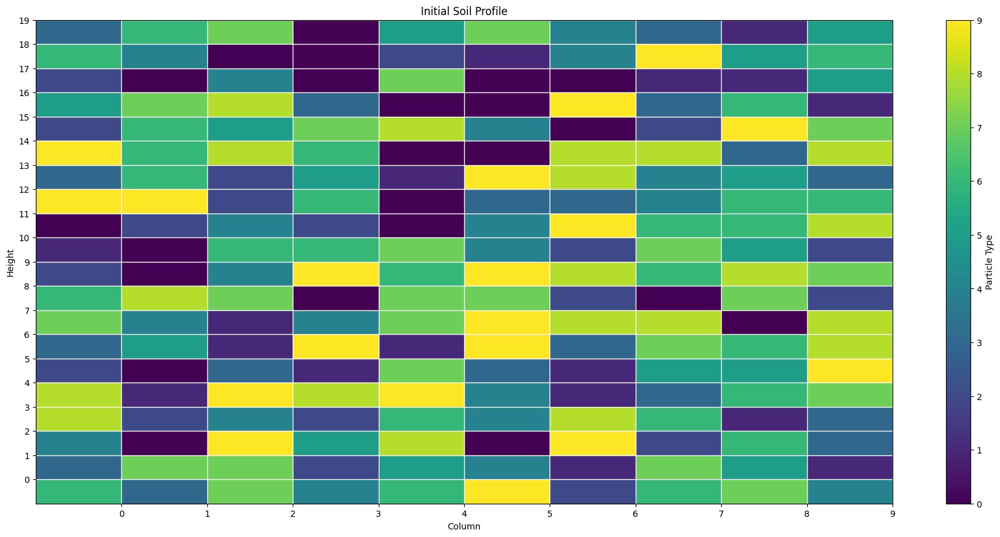

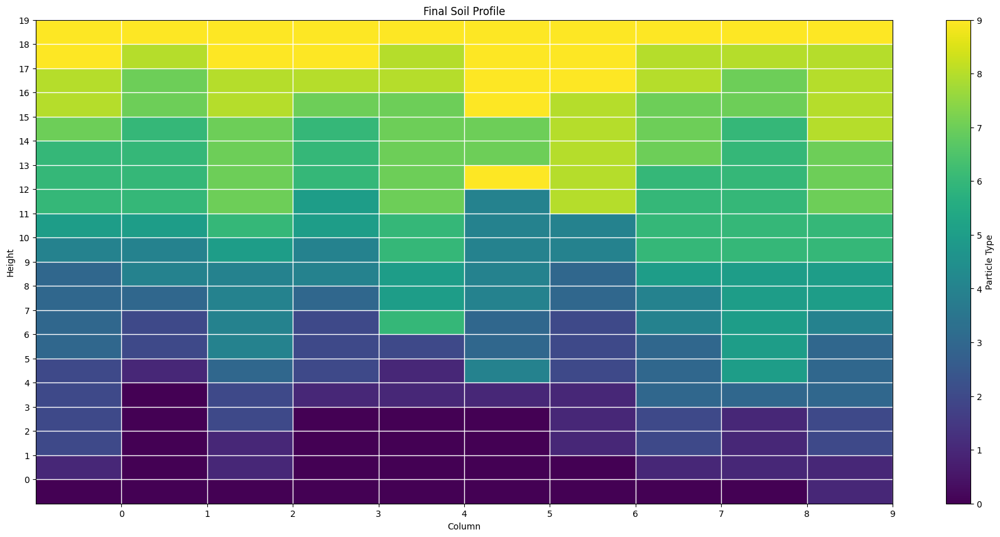

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

class BidisperseMaterialSimulationAdvanced2D1:
    def __init__(self, column_height=20, column_width=10, ks=1.0, gamma_dot=1.0, types=3):
        np.random.seed(42)  # For reproducibility
        self.grid = np.random.randint(types, size=(column_height, column_width)).astype(float)
        self.ks = ks  # Segregation rate control parameter
        self.gamma_dot = gamma_dot  # Shear rate
        self.history = [self.grid.copy()]  # Track history of segregation

    def calculate_segregation_rate(self, col, i):
        """Calculate the segregative force based on local and average grain size."""
        if i == 0 or i == len(self.grid[:, col]) - 1:  # Edge cases
            return 0
        si_j = self.grid[i, col]
        si_j_minus = self.grid[i - 1, col]
        si_j_plus = self.grid[i + 1, col]
        avg_size = (si_j_minus + si_j_plus) / 2.0
        return self.ks * self.gamma_dot * (si_j - avg_size)  # Original logic

    def segregate_step(self):
        """Performs one step of segregation adjusting for smaller particles to move downwards."""
        for col in range(self.grid.shape[1]):
            for phase in [0, 1]:
                for i in range(phase, len(self.grid[:, col]), 2):
                    f = self.calculate_segregation_rate(col, i)
                    if f > 0 and i < len(self.grid[:, col]) - 1:  # Smaller particles move down
                        self.grid[i, col], self.grid[i + 1, col] = self.grid[i + 1, col], self.grid[i, col]
                    elif f < 0 and i > 0:  # Larger particles move up
                        self.grid[i, col], self.grid[i - 1, col] = self.grid[i - 1, col], self.grid[i, col]
        self.history.append(self.grid.copy())

    def run_simulation(self, steps=50):
        """Runs the simulation over a specified number of steps."""
        for _ in range(steps):
            self.segregate_step()

    def plot_grid(self, data, title):
        """Plots the grid state with colorbar indicating particle type."""
        plt.figure(figsize=(22, 10))
        im = plt.imshow(data, aspect='auto', cmap='viridis', origin='lower')
        cbar = plt.colorbar(im, label='Particle Type')
        plt.title(title)
        plt.xlabel('Column')
        plt.ylabel('Height')
        plt.xticks(np.arange(0.5, data.shape[1], 1), np.arange(data.shape[1]))
        plt.yticks(np.arange(0.5, data.shape[0], 1), np.arange(data.shape[0]))
        plt.grid(True, linestyle='-', color='w', linewidth=1)
        plt.show()

    def animate(self):
        """Animates the segregation process."""
        fig, ax = plt.subplots()
        ax.set_title('Advanced Bidisperse Material Segregation Simulation 2D')
        im = ax.imshow(self.history[0], cmap='viridis', animated=True, origin='lower')
        def update(frame):
            im.set_array(self.history[frame])
            return [im]
        anim = FuncAnimation(fig, update, frames=len(self.history), blit=True, repeat=False)
        plt.close()
        return anim

# Example usage
simulation_advanced = BidisperseMaterialSimulationAdvanced2D1(column_height=20, column_width=10, types=10)
simulation_advanced.plot_grid(simulation_advanced.grid, 'Initial Soil Profile')
simulation_advanced.run_simulation(steps=50)
anim_advanced = simulation_advanced.animate()
anim_advanced.save('segregation.gif', writer=PillowWriter(fps=10))
simulation_advanced.plot_grid(simulation_advanced.history[-1], 'Final Soil Profile')


# **Polydisperse Segregation Model**



## **Time Evolution of Polydisperse Segregation**

Here we are plotting time evolution for different initial conditions of the following equation (defined by equation 16 in the given research paper):

$$ s = F^{1/(3 - \alpha_i)} $$

where $ F(s) = \int_{s_{\text{m}}}^{s} s' \phi(s') \, ds' $) ds is the cumulative grainsize distribution function and $3−α_i$ is the initial power law gradient.

We have plotted the Time Evolution under 3 different conditions:
1. $α_i=-2$
2. $α_i=0$
3. $α_i=2$

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class PolydisperseSegregationModel4:
    def __init__(self, column_height, num_cells_m, segregation_rate, alpha_i, time_step):
        self.column_height = column_height
        self.num_cells_m = num_cells_m
        # Ensure segregation_rate is a numpy array to enable element-wise operations
        self.segregation_rate = np.array(segregation_rate)
        self.alpha_i = alpha_i
        self.time_step = time_step
        self.column = self.initialize_column()
        self.history = []

    def initialize_column(self):
        # Initialize column with a range of particle sizes based on Eq. 16
        F = np.random.rand(self.column_height, self.num_cells_m)
        s = F**(1 / (3 - self.alpha_i))
        return s

    def run_simulation(self, total_time):
        for _ in np.arange(0, total_time, self.time_step):
            self.segregate()
            self.history.append(self.column.copy())

    def segregate(self):
      for i in range(self.column_height):
          for j in range(self.num_cells_m):
              z = i / self.column_height
              s = self.column[i][j]
              if s <= 0:
                  continue  # Skip the computation if s is zero or negative
              gamma_dot = np.sqrt(max(0, (1 - z) / max(s, 1e-6)))  # Adding a small epsilon to s to avoid division by zero
              local_average_size = np.mean(self.column[i, :])
              segregative_velocity = self.segregation_rate[i] * gamma_dot * (s / local_average_size - 1)
              self.column[i, j] += segregative_velocity * self.time_step

    def plot_history(self):
        average_grain_size_history = [np.mean(state, axis=1) for state in self.history]
        plt.imshow(average_grain_size_history, aspect='auto', origin='lower', cmap='viridis')
        plt.colorbar(label='Average Grain Size')
        plt.xlabel('Time')
        plt.ylabel('Height')
        plt.title('Time Evolution of Polydisperse Segregation')
        plt.show()



# $$α_i=-2$$


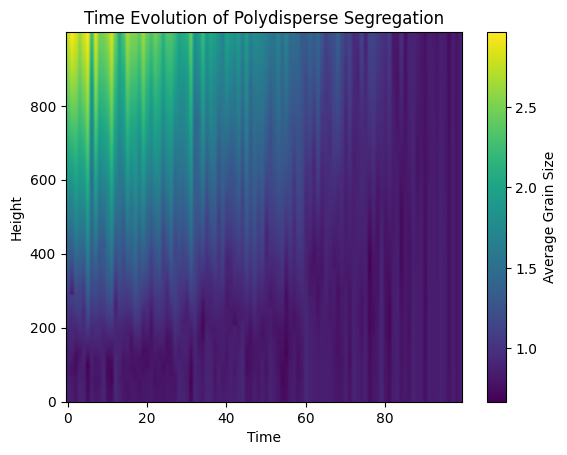

In [ ]:
column_height = 100  # Number of vertical cells
num_cells_m = 10     # Number of cells in m-direction for polydispersity
alpha_i = -2         # Initial power law gradient
time_step = 0.01     # Simulation time step
total_time = 10       # Total simulation time

# Initialize the model with non-uniform segregation rate
segregation_rate = [np.sqrt(1 - i / column_height) for i in range(column_height)]

model = PolydisperseSegregationModel4(column_height, num_cells_m, segregation_rate, alpha_i, time_step)

# Run the simulation|
model.run_simulation(total_time)

# Plot the results
model.plot_history()

# $$α_i=0$$

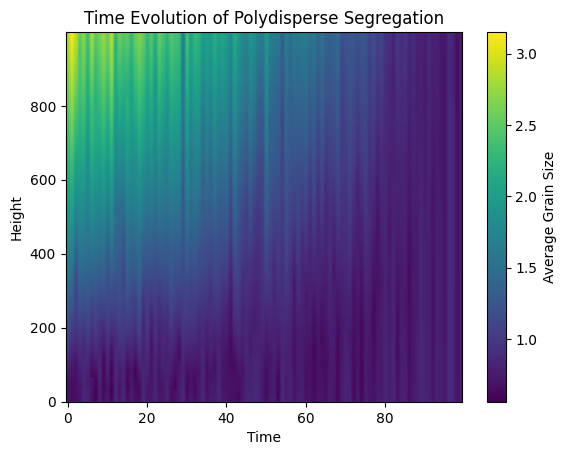

In [ ]:
column_height = 100  # Number of vertical cells
num_cells_m = 10     # Number of cells in m-direction for polydispersity
alpha_i = 0         # Initial power law gradient
time_step = 0.01     # Simulation time step
total_time = 10       # Total simulation time

# Initialize the model with non-uniform segregation rate
segregation_rate = [np.sqrt(1 - i / column_height) for i in range(column_height)]

model = PolydisperseSegregationModel4(column_height, num_cells_m, segregation_rate, alpha_i, time_step)

# Run the simulation
model.run_simulation(total_time)

# Plot the results
model.plot_history()

# $$α_i=2$$

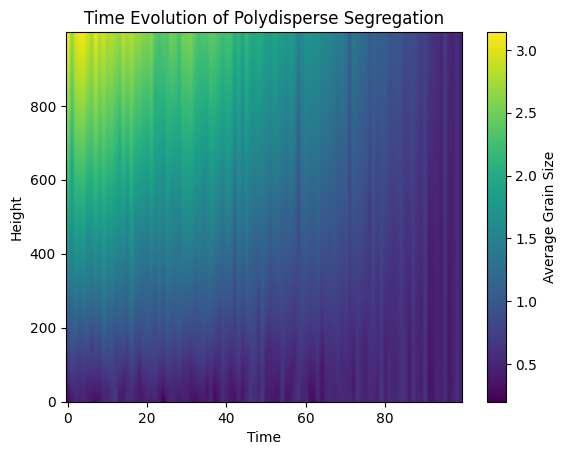

In [ ]:
column_height = 100  # Number of vertical cells
num_cells_m = 10     # Number of cells in m-direction for polydispersity
alpha_i = 2         # Initial power law gradient
time_step = 0.01     # Simulation time step
total_time = 10       # Total simulation time

# Initialize the model with non-uniform segregation rate
segregation_rate = [np.sqrt(1 - i / column_height) for i in range(column_height)]

model = PolydisperseSegregationModel4(column_height, num_cells_m, segregation_rate, alpha_i, time_step)

# Run the simulation
model.run_simulation(total_time)

# Plot the results
model.plot_history()

## A detailed breakdown of the above plots:

<hr>

### Color Mapping
**Color Scale (Average Grain Size):** The color scale on the right indicates the average particle size at various heights over time. The scale typically ranges from smaller sizes (shown in purple) to larger sizes (shown in yellow). <br>This gradient suggests that:<br>
**Purple and Blue Shades: Represent smaller grain sizes.**<br>
**Green to Yellow Shades: Represent larger grain sizes.**

<hr>

### Interpretation of the Plot Dynamics
**Vertical Gradient:** Observing a vertical gradient where colors change distinctly from top (yellow) to bottom (purple) suggests that larger particles are moving upwards or that **smaller particles are more prevalent at the bottom as the simulation progresses**. This is the result of the segregation mechanics where particles with different sizes move relative to each other due to imposed shear and other dynamics specified in the research paper.

<hr>

### Key Observations
**Gradient Formation:** The formation of a gradient where particle sizes change systematically from bottom to top suggests effective segregation. Initially, particles might have been more mixed (if the initial conditions were randomized), but over time, due to the segregation mechanics (like gravity, vibration, or other forces modeled), they sort themselves based on size.

**No Clear Segregation Layers:** The continuous gradient rather than distinct layers of colors suggests a smooth variation in particle sizes from one level to another, indicating a more nuanced form of segregation without abrupt transitions, which is expected in a highly polydisperse system.

<br><hr>

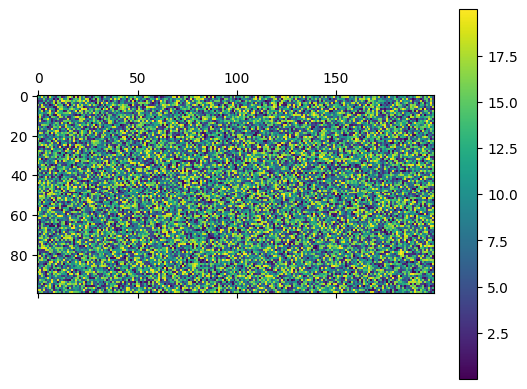

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

class PolydisperseSegregation:
    def __init__(self, height, width, types, ks=1.0, gamma_dot=1.0):
        self.grid = np.random.rand(height, width) * types  # More continuous range of grain sizes
        self.ks = ks
        self.gamma_dot = gamma_dot
        self.history = [self.grid.copy()]

    def segregate_step(self):
        movement = np.zeros_like(self.grid)
        for i in range(1, self.grid.shape[0]-1):
            for j in range(self.grid.shape[1]):
                above = self.grid[i-1, j]
                below = self.grid[i+1, j]
                current = self.grid[i, j]
                # Calculate segregative velocity based on grain size differences
                if current > below:
                    movement[i, j] -= self.ks * self.gamma_dot * (current - below)
                if current < above:
                    movement[i, j] += self.ks * self.gamma_dot * (above - current)
        # Update grid based on movement
        for i in range(1, self.grid.shape[0]-1):
            for j in range(self.grid.shape[1]):
                if movement[i, j] > 0 and self.grid[i, j] < self.grid[i-1, j]:
                    self.grid[i, j], self.grid[i-1, j] = self.grid[i-1, j], self.grid[i, j]
                elif movement[i, j] < 0 and self.grid[i, j] > self.grid[i+1, j]:
                    self.grid[i, j], self.grid[i+1, j] = self.grid[i+1, j], self.grid[i, j]
        self.history.append(self.grid.copy())

    def animate(self):
        fig, ax = plt.subplots()
        mat = ax.matshow(self.history[0], cmap='viridis')
        plt.colorbar(mat)

        def update(frame):
            mat.set_data(self.history[frame])
            return [mat]

        ani = FuncAnimation(fig, update, frames=len(self.history), interval=50)
        plt.show()

# Parameters
height, width, types = 100, 200, 20  # Increase types for more variation
simulation = PolydisperseSegregation(height, width, types)
simulation.segregate_step()  # Run multiple steps if needed
simulation.animate()


## Polydisperse Segregation
*** considering ks=1 and shear_rate=1***

<ipython-input-40-ee4bb9a0ac8f>:31: RuntimeWarning: invalid value encountered in sqrt
  gamma_dot = np.sqrt(shear_factor)


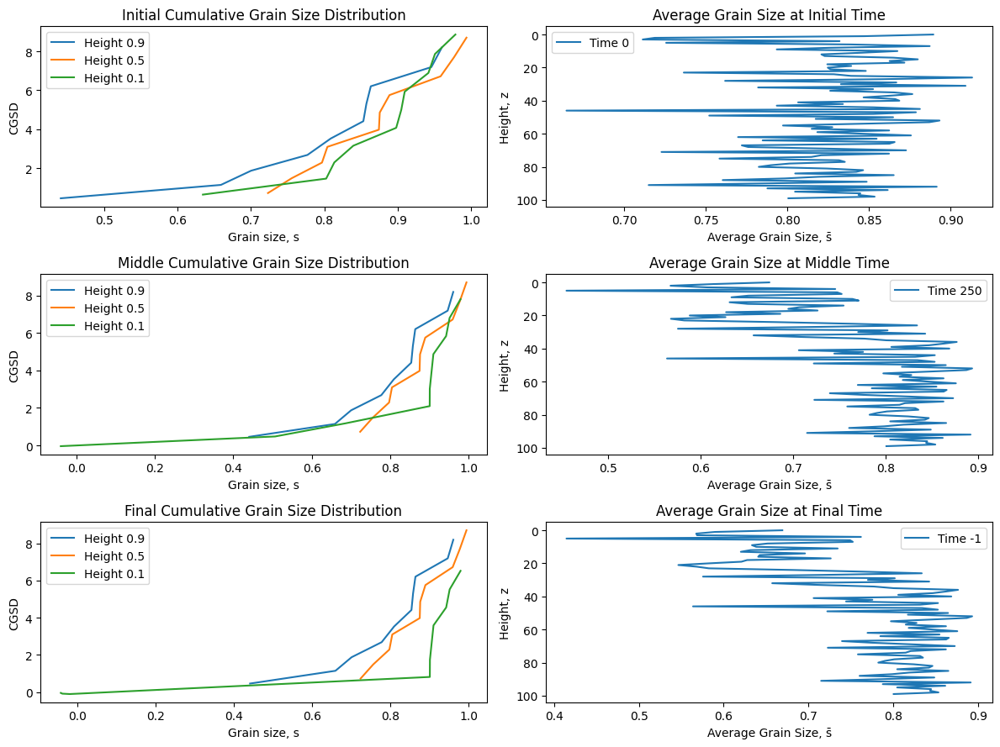

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class PolydisperseSegregationModel:
    def __init__(self, column_height, num_cells_m, segregation_rate, alpha_i, time_step):
        self.column_height = column_height
        self.num_cells_m = num_cells_m
        self.segregation_rate = np.array(segregation_rate)
        self.alpha_i = alpha_i
        self.time_step = time_step
        self.column = self.initialize_column()
        self.history = []

    def initialize_column(self):
        F = np.random.rand(self.column_height, self.num_cells_m)
        s = F**(1 / (3 - self.alpha_i))
        return s

    def run_simulation(self, total_time):
        for _ in np.arange(0, total_time, self.time_step):
            self.segregate()
            self.history.append(self.column.copy())

    def segregate(self):
      for i in range(self.column_height):
        for j in range(self.num_cells_m):
            z = i / self.column_height
            s = self.column[i, j]
            # Ensure that (1 - z) / s is always non-negative
            shear_factor = (1 - z) / s if s <= (1 - z) else 0
            gamma_dot = np.sqrt(shear_factor)
            local_average_size = np.mean(self.column[i, :])
            segregative_velocity = self.segregation_rate[i] * gamma_dot * (s - local_average_size)
            # Check for NaN values and avoid updating if encountered
            if not np.isnan(segregative_velocity):
                self.column[i, j] += segregative_velocity * self.time_step

    def plot_results(self):
    # Function to plot the final graphs similar to Figure 14 in the paper

    # Plot the cumulative grainsize distributions at different heights
      fig, axs = plt.subplots(3, 2, figsize=(12, 9))  # This creates a 3x2 grid of subplots
      time_snapshots = [0, len(self.history)//2, -1]  # Three time points: start, middle, and end

      for idx, time_point in enumerate(time_snapshots):
          # For the left column: Initial, Middle, and Final cumulative grainsize distributions
          grainsize_distribution = np.sort(self.history[time_point], axis=1)
          cumulative_distribution = np.cumsum(grainsize_distribution, axis=1) / grainsize_distribution[:, -1][:, np.newaxis]

          for height_fraction in [0.9, 0.5, 0.1]:
              height_index = int(height_fraction * self.column_height)
              axs[idx, 0].plot(grainsize_distribution[height_index], cumulative_distribution[height_index], label=f'Height {height_fraction}')
              axs[idx, 0].legend()

          axs[idx, 0].set_xlabel('Grain size, s')
          axs[idx, 0].set_ylabel('CGSD')

          # For the right column: Average grainsize over height at three time snapshots
          average_grainsize = np.mean(self.history[time_point], axis=1)
          axs[idx, 1].plot(average_grainsize, np.arange(self.column_height), label=f'Time {time_point}')
          axs[idx, 1].invert_yaxis()  # Invert y-axis to have 0 at the bottom
          axs[idx, 1].legend()

          axs[idx, 1].set_xlabel('Average Grain Size, s̄')
          axs[idx, 1].set_ylabel('Height, z')

      axs[0, 0].set_title("Initial Cumulative Grain Size Distribution")
      axs[0, 1].set_title(f'Average Grain Size at Initial Time')
      axs[1, 0].set_title("Middle Cumulative Grain Size Distribution")
      axs[1, 1].set_title(f'Average Grain Size at Middle Time')
      axs[2, 0].set_title("Final Cumulative Grain Size Distribution")
      axs[2, 1].set_title(f'Average Grain Size at Final Time')

      plt.tight_layout()
      plt.show()



# Define parameters based on the paper's descriptions
column_height = 100  # Number of vertical cells
num_cells_m = 10     # Number of cells in m-direction for polydispersity
alpha_i = -2         # Initial power law gradient
time_step = 0.01     # Simulation time step
total_time = 5       # Total simulation time
segregation_rate = [np.sqrt(1 - i / column_height) for i in range(column_height)]  # Segregation rate array

# Initialize and run the simulation
model = PolydisperseSegregationModel(column_height, num_cells_m, segregation_rate, alpha_i, time_step)
model.run_simulation(total_time)

# Plot the results as in the paper's figure
model.plot_results()

## [Link to Test Colab File](https://colab.research.google.com/drive/1drX7BLX4e-kVKZ2Q9R2pDHIjfBQb3stF?usp=sharing)